# Temporal recalibration project

kcho, Friday, September 22, 2017

## Import libraries

In [471]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from peakutils.peak import indexes
import scipy.interpolate as interpolate
from scipy.signal import butter, lfilter, freqz, find_peaks_cwt
import peakutils


%matplotlib inline

> Data from DH

In [12]:
ls

README.md                   park_5_exp_1_dataLog.txt
Untitled.ipynb              park_5_exp_2_dataLog.txt
park_3_2_exp_0_dataLog.txt  park_5_exp_3_dataLog.txt
park_3_2_exp_1_dataLog.txt  park_5_exp_4_dataLog.txt
park_5_exp_0_dataLog.txt


## 1. Load data

In [1231]:
data = pd.read_csv('park_3_2_exp_1_dataLog.txt', sep=',')
# data = pd.read_csv('parkHard_exp_0_dataLog.txt', sep=',')

> How the raw data looks

In [1232]:
data.head()

,time[us],volt(fsr)[v],signal,signal frequency[Hz]
0,221869028,0,0,1000
1,221869389,0,0,1000
2,221869750,0,0,1000
3,221870110,0,0,1000
4,221870470,0,0,1000


## 2. Data observation

> Data shape

In [1233]:
data.shape

(217711, 4)

> `time[us]` column

In [1234]:
data['time[us]'].head()

0    221869028
1    221869389
2    221869750
3    221870110
4    221870470
Name: time[us], dtype: int64

- Range of the time

In [1235]:
print('starts from : {}\nends at : {}'.format(
    data['time[us]'].min(), 
    data['time[us]'].max()))

starts from : 221869028
ends at : 300492272


- Increasement in the time axis

    - eg) t2 - t1

In [1236]:
np.ediff1d(data['time[us]'])

array([361, 361, 360, ..., 360, 361, 361])

- Unique values of the time increasement

In [1237]:
np.unique(np.ediff1d(data['time[us]']))

array([ 358,  359,  360,  361,  362,  363,  364,  365,  366,  367,  368,
        369,  370,  371, 1060, 1061])

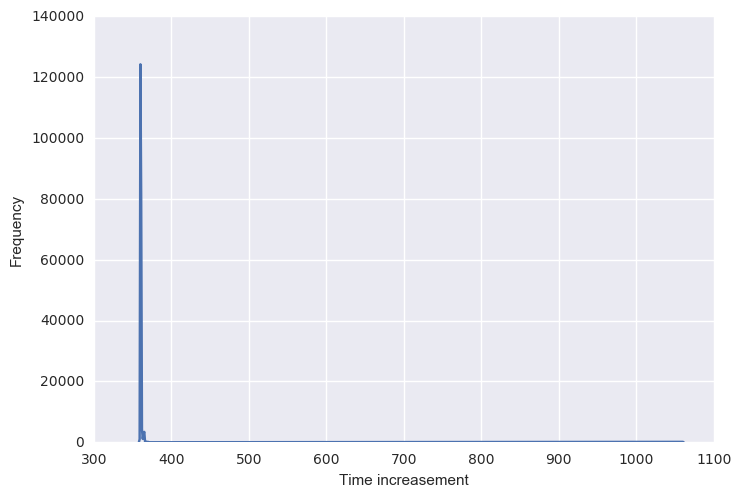

In [1238]:
tmp = pd.DataFrame(np.ediff1d(data['time[us]']))
tmp.columns = ['time increasement']
tmp = tmp.reset_index() 
plt.plot(tmp.groupby('time increasement').count().index, tmp.groupby('time increasement').count()['index'])
plt.ylabel('Frequency')
plt.xlabel('Time increasement')

In [1239]:
tmp.groupby('time increasement').count().T

time increasement,358,359,360,361,362,363,364,365,366,367,368,369,370,371,1060,1061
index,4,1025,124161,79961,4341,1134,2741,3423,104,184,188,96,150,23,155,20


In [1240]:
tmp.groupby('time increasement').count().index

Int64Index([ 358,  359,  360,  361,  362,  363,  364,  365,  366,  367,  368,
             369,  370,  371, 1060, 1061],
           dtype='int64', name='time increasement')

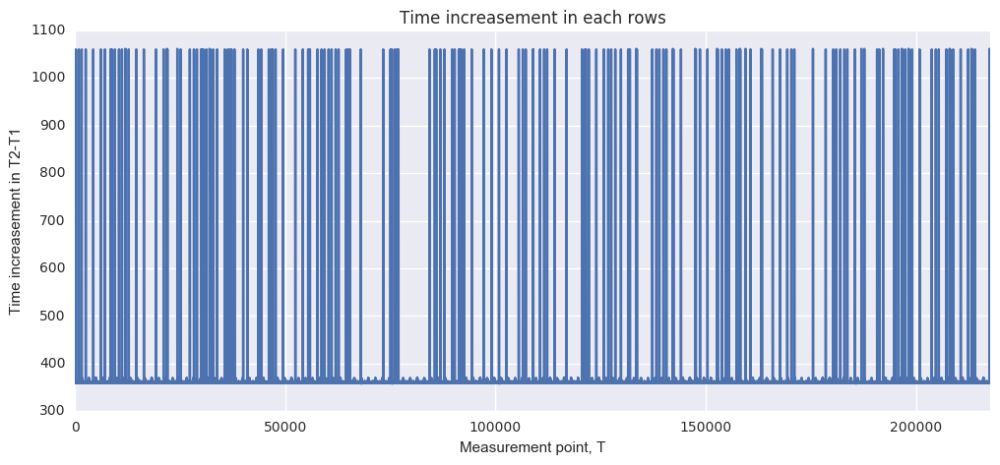

In [1241]:
plt.figure(figsize=(12,5))
plt.plot(np.ediff1d(data['time[us]']))
plt.title('Time increasement in each rows')
plt.xlim(0, len(tmp))
plt.xlabel('Measurement point, T')
plt.ylabel('Time increasement in T2-T1')
plt.show()

- Above shows that the time column is sparse

## 3. Interpolation

In [1242]:
f = interpolate.interp1d(data['time[us]'], data['volt(fsr)[v]'])
gap = 360
y = f(np.arange(data['time[us]'].min(), data['time[us]'].max(), gap))

f_signal = interpolate.interp1d(data['time[us]'], data['signal'], kind='nearest')
y_signal = f_signal(np.arange(data['time[us]'].min(), data['time[us]'].max(), gap))

> Data size before the interpolation

In [1243]:
len(data)

217711

> Data size after the interpolation

In [1244]:
len(y)

218398

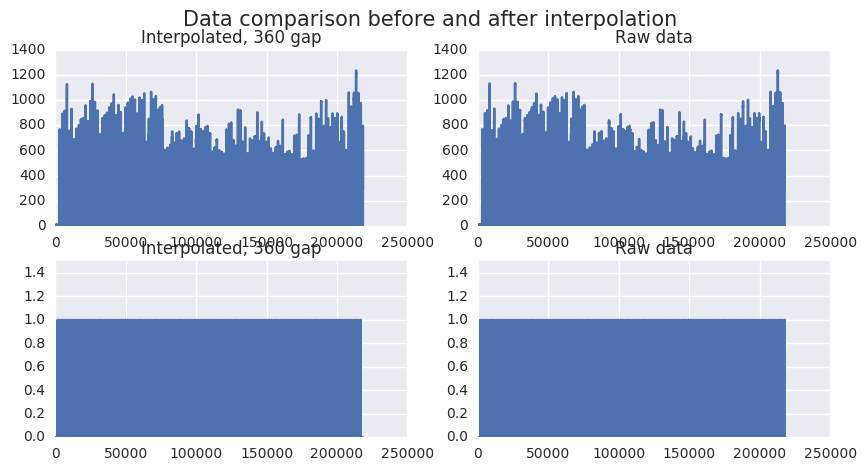

In [1245]:
fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(10,5))
ax = np.ravel(ax)
ax[0].plot(y)
ax[0].set_title('Interpolated, 360 gap')
ax[1].plot(data['volt(fsr)[v]'])
ax[1].set_title('Raw data')

ax[2].plot(y_signal)
ax[2].set_title('Interpolated, 360 gap')
ax[2].set_ylim(0,1.5)
ax[3].plot(data['signal'])
ax[3].set_title('Raw data')
ax[3].set_ylim(0,1.5)

plt.suptitle('Data comparison before and after interpolation', fontsize=15)
plt.show()

> Save the interpolated as `data_reponse_interp_360`

In [1246]:
data_reponse_interp_360 = pd.DataFrame({'time[us]':np.arange(data['time[us]'].min(), data['time[us]'].max(), gap),
                                        'volt(fsr)[v]':y,
                                        'signal':y_signal})

## 5. Threshold the response

In [1247]:
threshold = 80
data_reponse_interp_360.loc[data_reponse_interp_360['volt(fsr)[v]'] < 80, 'volt(fsr)[v]'] = 0 

## 7. Split the dataframe

In [1248]:
# difference between consecutive element
pre_post_signal_diff = np.ediff1d(data_reponse_interp_360['signal'])

# where the difference is +1 : Signal turning on (0 --> 1)
# 1 has been added to return the index of first 'on'
signal_first_ones_index = np.where(pre_post_signal_diff==1)[0] + 1
signal_first_ones_time = data_reponse_interp_360.loc[signal_first_ones_index, 'time[us]'].values

signal_last_ones_index = np.where(pre_post_signal_diff==-1)[0]
signal_last_ones_time = data_reponse_interp_360.loc[signal_last_ones_index, 'time[us]'].values

# 300 ms
# need to make this multiples of 360
cut_window_div = 300000 / 360
cut_time = signal_first_ones_index - round(cut_window_div)

data_split = np.split(data_reponse_interp_360, 
                      cut_time)[1:]

In [1249]:
len(data_split)

130

## 8. Find peaks in each epochs

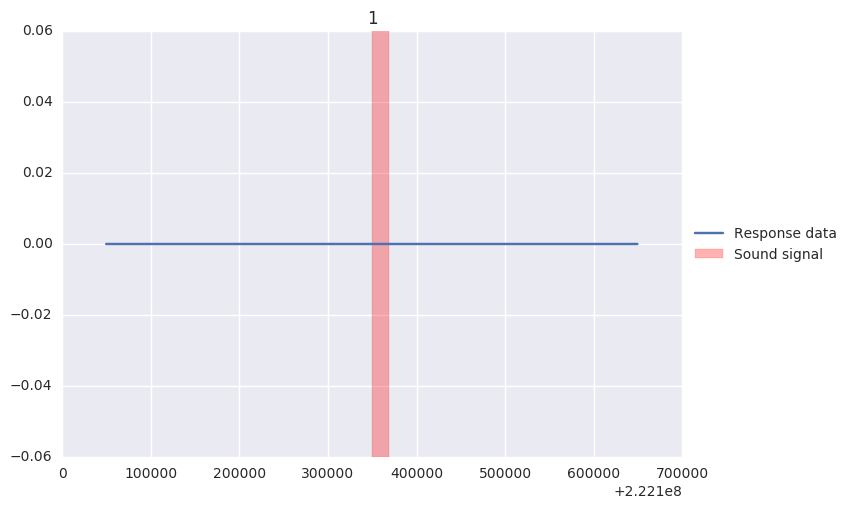

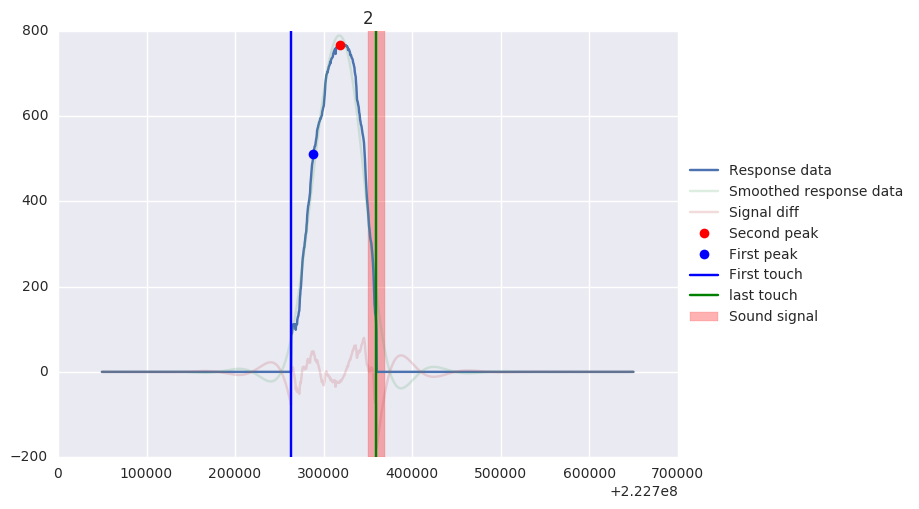

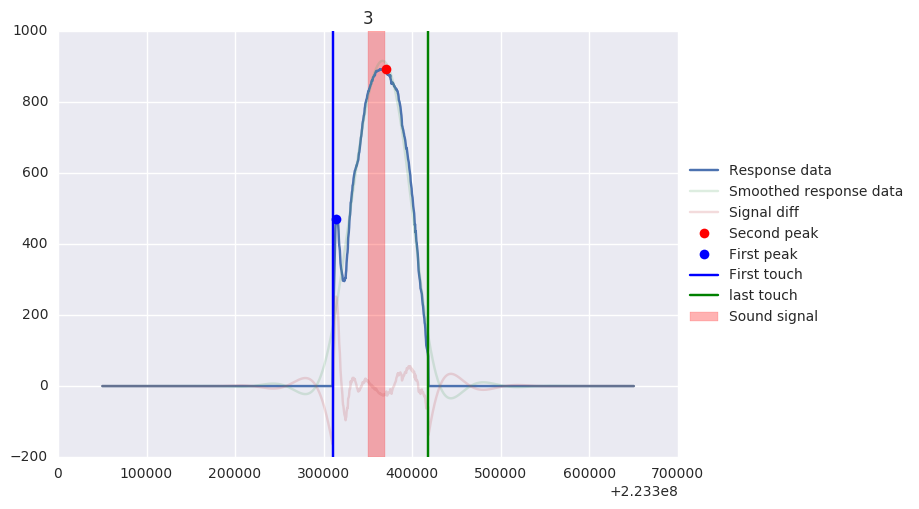

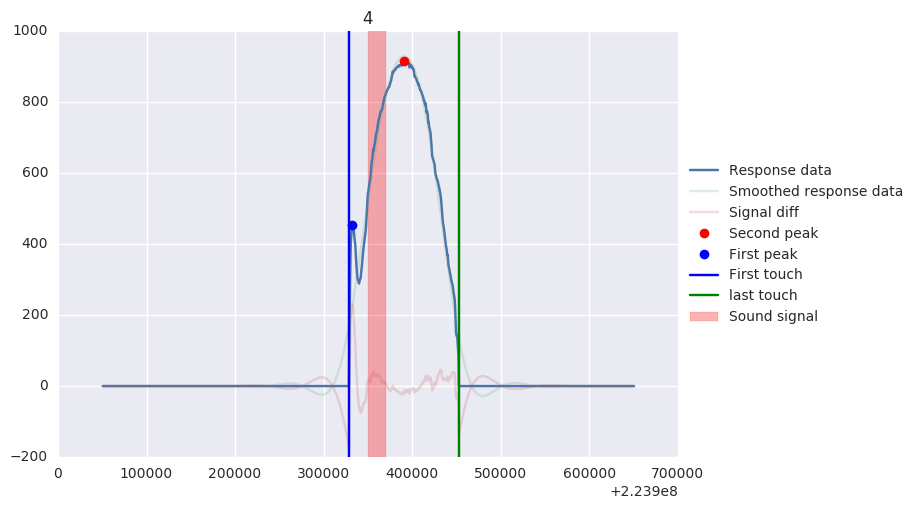

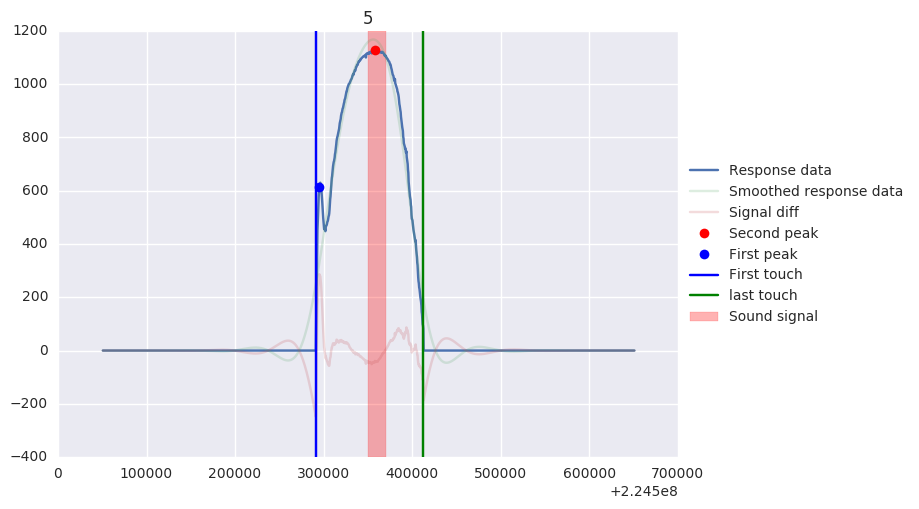

...

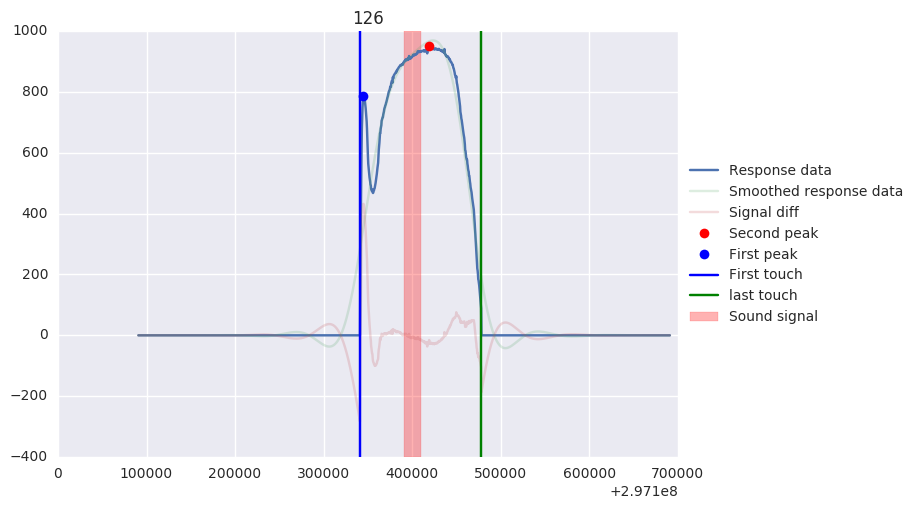

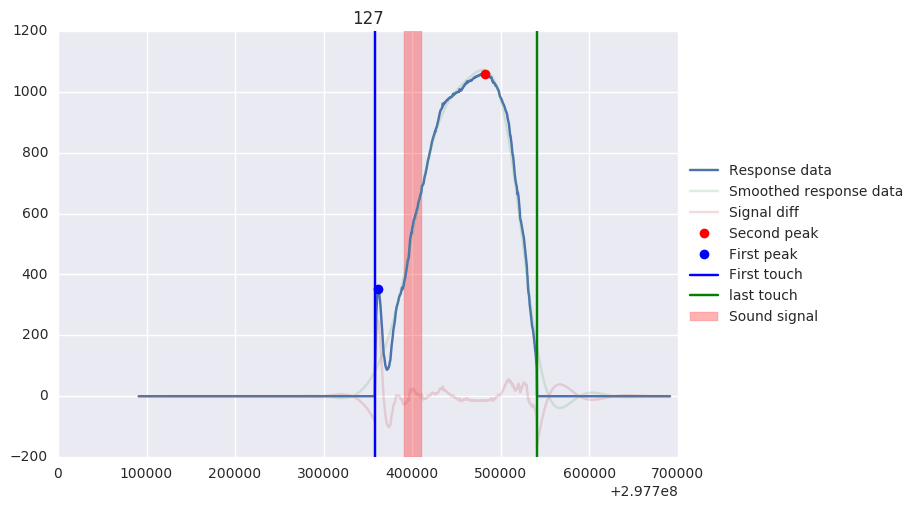

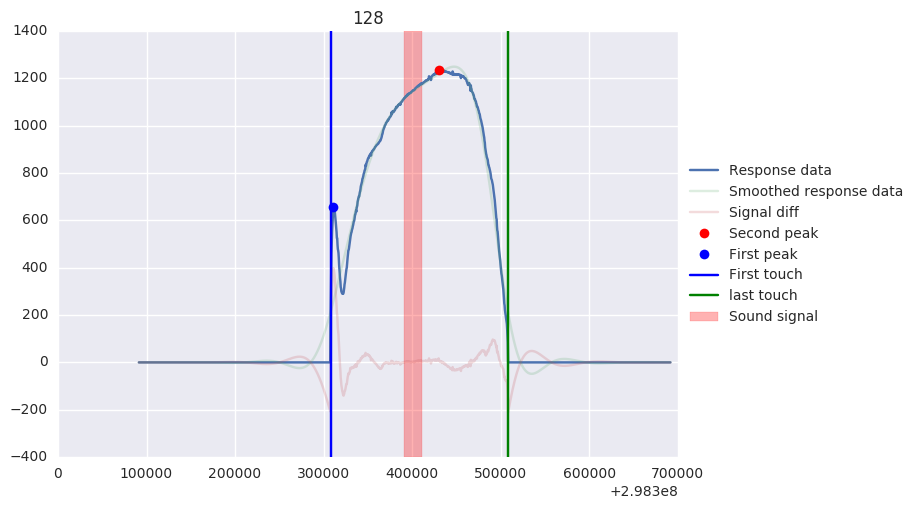

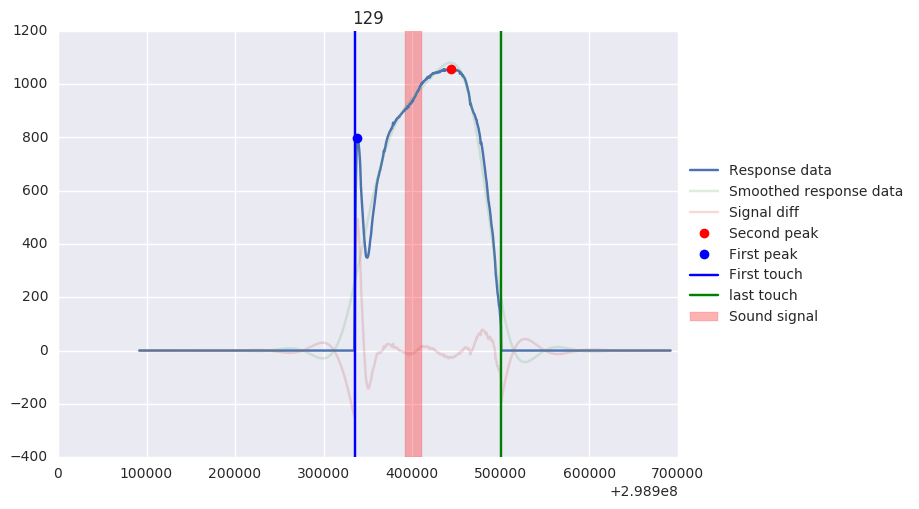

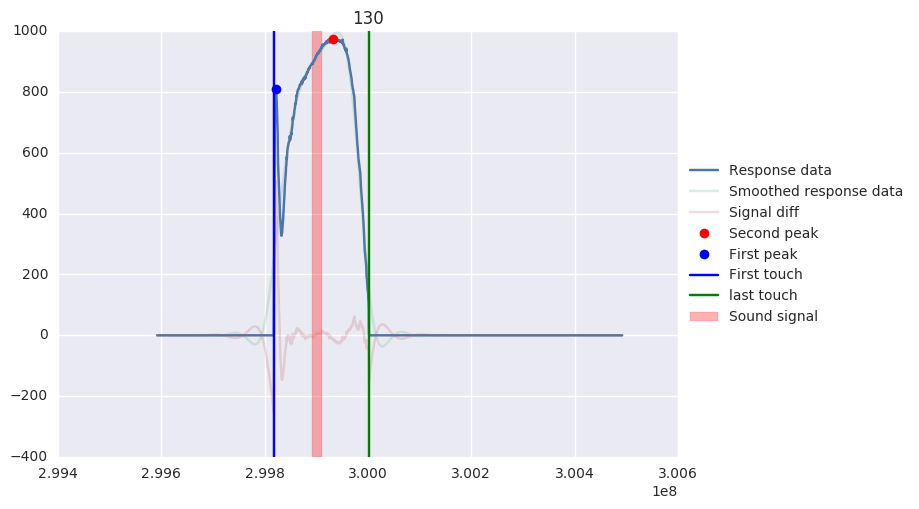

Error epochs :  2 46
Missing epochs :  1


In [1250]:
missing_epochs = []
error_epochs = []
for num, df_tmp in enumerate(data_split, 1):
    if len(df_tmp[df_tmp['volt(fsr)[v]'] > 80]) == 0:
        missing_epochs.append(num)
        plt.plot(df_tmp['time[us]'], df_tmp['volt(fsr)[v]'], label='Response data')
        plt.axvspan(df_tmp[df_tmp['signal']!=0]['time[us]'].values[0], 
                    df_tmp[df_tmp['signal']!=0]['time[us]'].values[-1], 
                    color='r', alpha=0.3, label = 'Sound signal')
        plt.title(num)
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        plt.show()
        continue
        
    # if there are more than two responses
    elif np.any(np.diff(df_tmp[df_tmp['volt(fsr)[v]'] > 80].index)!=1):
        cut_index_thr = np.diff(df_tmp[df_tmp['volt(fsr)[v]'] > 80].index).argmax()
        cut_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[cut_index_thr]

        # select longer part of the response
        first_df_tmp = df_tmp.ix[:cut_index]
        second_df_tmp = df_tmp.ix[cut_index:]
        get_longer_df = lambda x,y : x if len(x[x['volt(fsr)[v]']>80]) > len(y[y['volt(fsr)[v]']>80]) else y
        new = get_longer_df(first_df_tmp, second_df_tmp)
        new = new.reindex_like(df_tmp)
        new['time[us]'] = df_tmp['time[us]']
        new['signal'] = df_tmp['signal']
        df_tmp = new
        df_tmp.ix[df_tmp.index[df_tmp.isnull()['volt(fsr)[v]']], 'volt(fsr)[v]'] = 0
        
            
    # first contact 
    first_touch_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[0]
    # last contact
    last_touch_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[-1]

    # Estimating second peak
    # Smooth data : strong smoothing
    b, a = signal.butter(4, 0.01)
    df_tmp['svolt(fsr)[v]'] = signal.filtfilt(b, a, df_tmp['volt(fsr)[v]'])

    max_response_index_from_strong_smoothing = df_tmp['svolt(fsr)[v]'].idxmax()
    second_window_time = 50
    lower_window_bound_2nd_peak = max_response_index_from_strong_smoothing - second_window_time
    higher_window_bound_2nd_peak = max_response_index_from_strong_smoothing + second_window_time
    second_peak_value = df_tmp['volt(fsr)[v]'].ix[lower_window_bound_2nd_peak:higher_window_bound_2nd_peak].max()
    second_peak_index = df_tmp['volt(fsr)[v]'].ix[lower_window_bound_2nd_peak:higher_window_bound_2nd_peak].idxmax()
    second_peak_time = df_tmp.ix[second_peak_index, 'time[us]']

    # First peak
    # must appear before the second peak
    first_peak_index = (df_tmp['volt(fsr)[v]'] - df_tmp['svolt(fsr)[v]']).ix[:second_peak_index].idxmax()
    first_peak_value = df_tmp.ix[first_peak_index, 'volt(fsr)[v]']
    first_peak_time = df_tmp.ix[first_peak_index, 'time[us]']

    # If first peak is far from the first touch
    if (first_peak_index - first_touch_index) > 25:
        error_epochs.append(num)

        
    # Plot gradient
    plt.plot(df_tmp['time[us]'], 
             df_tmp['volt(fsr)[v]'], label='Response data')
    plt.plot(df_tmp['time[us]'], 
             df_tmp['svolt(fsr)[v]'], alpha=0.2, label='Smoothed response data')
    plt.plot(df_tmp['time[us]'], 
             df_tmp['volt(fsr)[v]'] - df_tmp['svolt(fsr)[v]'], 
             alpha=0.2, label='Signal diff')
    plt.plot(second_peak_time, second_peak_value, 'ro', label='Second peak')
    plt.plot(first_peak_time, first_peak_value, 'bo', label='First peak')
    plt.axvspan(df_tmp[df_tmp['signal']!=0]['time[us]'].values[0], 
                df_tmp[df_tmp['signal']!=0]['time[us]'].values[-1], 
                color='r', alpha=0.3, label = 'Sound signal')
    plt.axvline(df_tmp.ix[first_touch_index, 'time[us]'], label = 'First touch')
    plt.axvline(df_tmp.ix[last_touch_index, 'time[us]'], color='green', label = 'last touch')
    plt.title(num)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))


    plt.show()

print('Error epochs : ', ' '.join([str(x) for x in error_epochs]))
print('Missing epochs : ', ' '.join([str(x) for x in missing_epochs]))

> Save the df

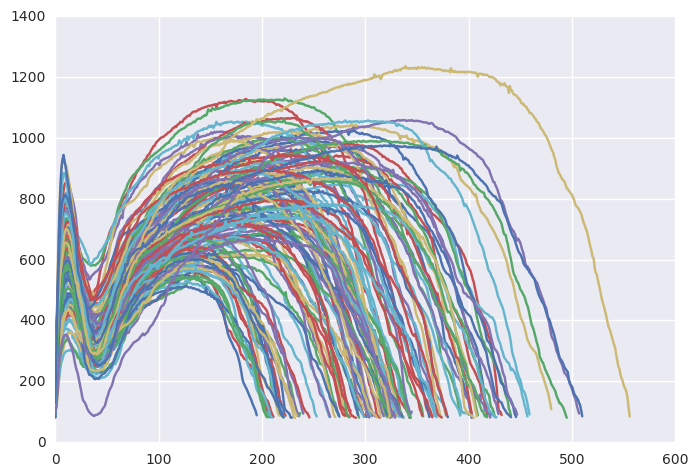

In [1251]:
response_only_df = pd.DataFrame()
timing_df = pd.DataFrame()
timing_diff_df = pd.DataFrame()
for num, df_tmp in enumerate(data_split, 1):
    if len(df_tmp[df_tmp['volt(fsr)[v]'] > 80]) == 0:
        missing_epochs.append(num)
        continue
        
    # if there are more than two responses
    elif np.any(np.diff(df_tmp[df_tmp['volt(fsr)[v]'] > 80].index)!=1):
        cut_index_thr = np.diff(df_tmp[df_tmp['volt(fsr)[v]'] > 80].index).argmax()
        cut_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[cut_index_thr]

        # select longer part of the response
        first_df_tmp = df_tmp.ix[:cut_index]
        second_df_tmp = df_tmp.ix[cut_index:]
        get_longer_df = lambda x,y : x if len(x[x['volt(fsr)[v]']>80]) > len(y[y['volt(fsr)[v]']>80]) else y
        new = get_longer_df(first_df_tmp, second_df_tmp)
        new = new.reindex_like(df_tmp)
        new['time[us]'] = df_tmp['time[us]']
        new['signal'] = df_tmp['signal']
        df_tmp = new
        df_tmp.ix[df_tmp.index[df_tmp.isnull()['volt(fsr)[v]']], 'volt(fsr)[v]'] = 0

    # first contact 
    first_touch_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[0]
    first_touch_time = df_tmp.ix[first_touch_index, 'time[us]']
    # last contact
    last_touch_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[-1]
    last_touch_time = df_tmp.ix[last_touch_index, 'time[us]']
    
    # sound first
    first_sound_index = df_tmp[df_tmp['signal']!=0].index.values[0]
    first_sound_time = df_tmp.ix[first_sound_index, 'time[us]']
    
    # Estimating second peak
    # Smooth data : strong smoothing
    b, a = signal.butter(4, 0.01)
    df_tmp['svolt(fsr)[v]'] = signal.filtfilt(b, a, df_tmp['volt(fsr)[v]'])

    max_response_index_from_strong_smoothing = df_tmp['svolt(fsr)[v]'].idxmax()
    second_window_time = 50
    lower_window_bound_2nd_peak = max_response_index_from_strong_smoothing - second_window_time
    higher_window_bound_2nd_peak = max_response_index_from_strong_smoothing + second_window_time
    second_peak_value = df_tmp['volt(fsr)[v]'].ix[lower_window_bound_2nd_peak:higher_window_bound_2nd_peak].max()
    second_peak_index = df_tmp['volt(fsr)[v]'].ix[lower_window_bound_2nd_peak:higher_window_bound_2nd_peak].idxmax()
    second_peak_time = df_tmp.ix[second_peak_index, 'time[us]']

    # First peak
    # must appear before the second peak
    first_peak_index = (df_tmp['volt(fsr)[v]'] - df_tmp['svolt(fsr)[v]']).ix[:second_peak_index].idxmax()
    first_peak_value = df_tmp.ix[first_peak_index, 'volt(fsr)[v]']
    first_peak_time = df_tmp.ix[first_peak_index, 'time[us]']
    
    
    timing_df_tmp = pd.DataFrame({'epoch':[num],
                              'first_touch_time':first_touch_time,
                              'first_peak_time':first_peak_time,
                              'first_peak_amplitude':first_peak_value,
                              'second_peak_time':second_peak_time,
                              'second_peak_amplitude':second_peak_value,
                              'last_touch_time':last_touch_time})
    
    timing_diff_df_tmp = pd.DataFrame({'epoch':[num],
                                       'diff_in_peak':second_peak_time-first_peak_time,
                                       'touch_duration':last_touch_time-first_touch_time,
                                       'diff_in_peak_1_to_sound_onset':first_sound_time-first_peak_time,
                                       'diff_in_peak_2_to_sound_onset':first_sound_time-second_peak_time,
                                       'diff_in_first_touch_to_sound_onset':first_sound_time-first_touch_time,
                                       'diff_in_last_touch_to_sound_onset':first_sound_time-last_touch_time,
                                      })
    timing_df = pd.concat([timing_df, timing_df_tmp.set_index('epoch')])
    timing_diff_df = pd.concat([timing_diff_df, timing_diff_df_tmp.set_index('epoch')])

        
    if num not in error_epochs and num not in missing_epochs:
        df_tmp = df_tmp[df_tmp['volt(fsr)[v]'] != 0].reset_index()
        response_only_df = pd.concat([response_only_df, df_tmp['volt(fsr)[v]']], axis=1)
        plt.plot(df_tmp.reset_index().index, df_tmp['volt(fsr)[v]'])
plt.show()

In [1252]:
timing_df

,first_peak_amplitude,first_peak_time,first_touch_time,last_touch_time,second_peak_amplitude,second_peak_time
epoch,,,,,,
2,511.650000,222988268,222963428,223059548,768.000000,223018508
3,471.734072,223613948,223610348,223717988,892.419444,223670828
4,452.238227,224232068,224228828,224352308,915.350000,224291108
5,615.025000,224795108,224791508,224912468,1127.412088,224857748
6,470.797784,225430868,225427628,225526268,755.927778,225486668
7,533.177285,225973388,225970148,226081388,930.627778,226038188
8,366.800000,226597628,226594748,226690148,690.700000,226648028
9,464.085873,227198108,227194148,227311508,772.450549,227257508
10,387.355556,227842508,227839628,227955548,802.541667,227915948


In [1253]:
timing_diff_df.describe()

,diff_in_first_touch_to_sound_onset,diff_in_last_touch_to_sound_onset,diff_in_peak,diff_in_peak_1_to_sound_onset,diff_in_peak_2_to_sound_onset,touch_duration
count,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000
mean,99828.837209,-18541.395349,67317.209302,95642.790698,28325.581395,118370.232558
std,63746.587747,74830.469070,19617.703221,63074.048385,69614.505267,27336.382478
min,-139680.000000,-271080.000000,30240.000000,-143280.000000,-219960.000000,70200.000000
25%,62280.000000,-60480.000000,52200.000000,57960.000000,-6120.000000,100800.000000
50%,101880.000000,-15120.000000,64800.000000,97560.000000,27360.000000,117360.000000
75%,138600.000000,34560.000000,79200.000000,134280.000000,75600.000000,134640.000000
max,299880.000000,175680.000000,120960.000000,263160.000000,221040.000000,200160.000000


In [1230]:
timing_df.to_csv('/Users/kangik/Downloads/hard_timing_2017_09_26.csv')
timing_diff_df.to_csv('/Users/kangik/Downloads/hard_timing_diff_2017_09_26.csv')

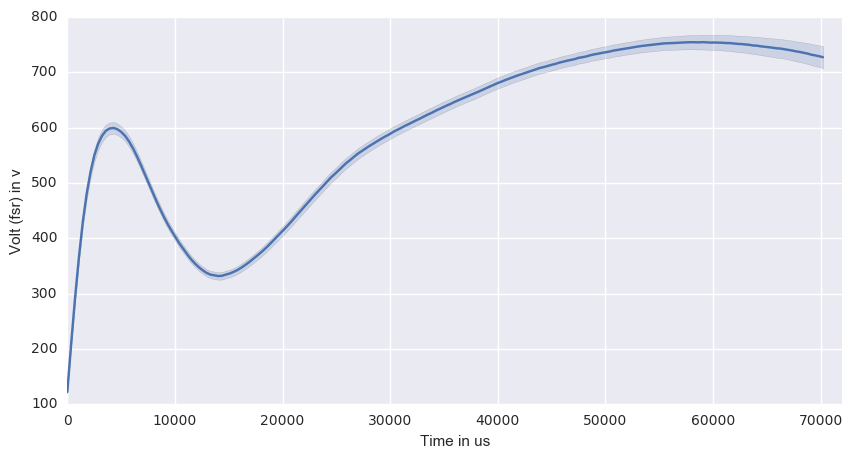

In [1254]:
response_only_df.columns = np.arange(1, len(response_only_df.columns)+1)
response_only_df = response_only_df.stack().reset_index()
response_only_df.columns = ['time', 'epoch', 'response']
response_only_df['time'] = response_only_df['time']*360
fig, axes = plt.subplots(ncols=1, figsize=(10,5))
ax = sns.tsplot(data=response_only_df, 
                time='time', 
                unit='epoch', 
                value='response', 
                ax=axes)
ax.set_xlim(0, 72000)
ax.set_xlabel('Time in us')
ax.set_ylabel('Volt (fsr) in v')
plt.show()

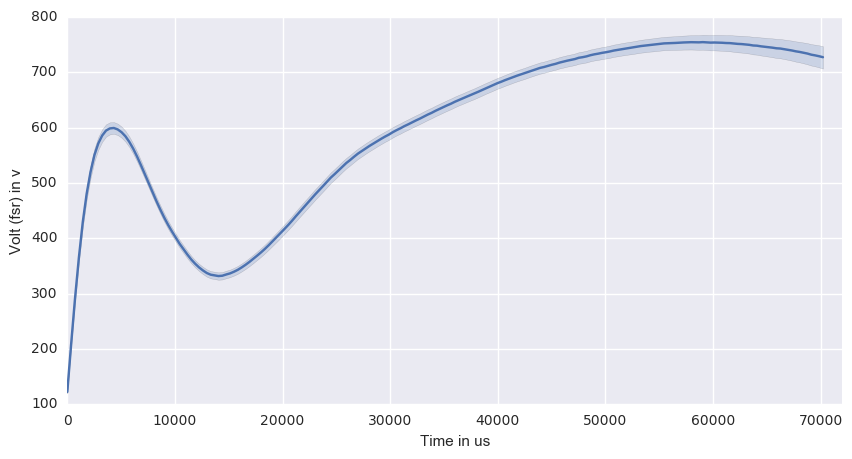

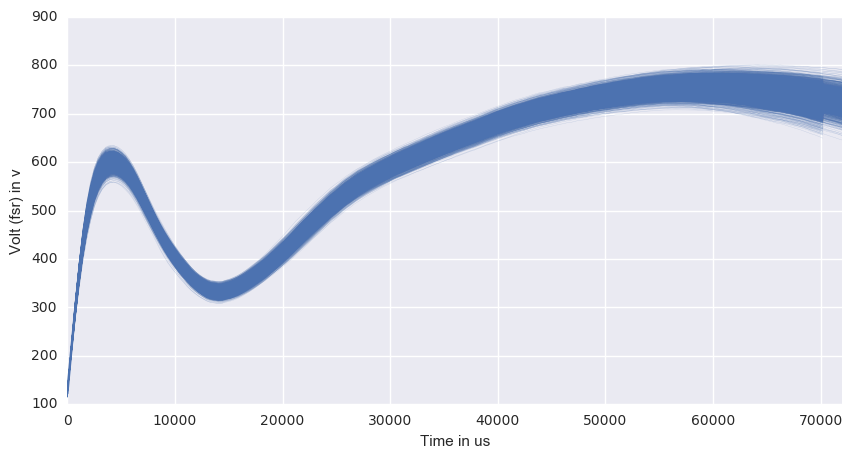

In [1168]:
fig, axes = plt.subplots(ncols=1, figsize=(10,5))
ax = sns.tsplot(data=response_only_df, 
                time='time', 
                unit='epoch', 
                value='response', 
                err_style='boot_traces',
                ax=axes)
ax.set_xlim(0, 72000)
ax.set_xlabel('Time in us')
ax.set_ylabel('Volt (fsr) in v')
plt.show()

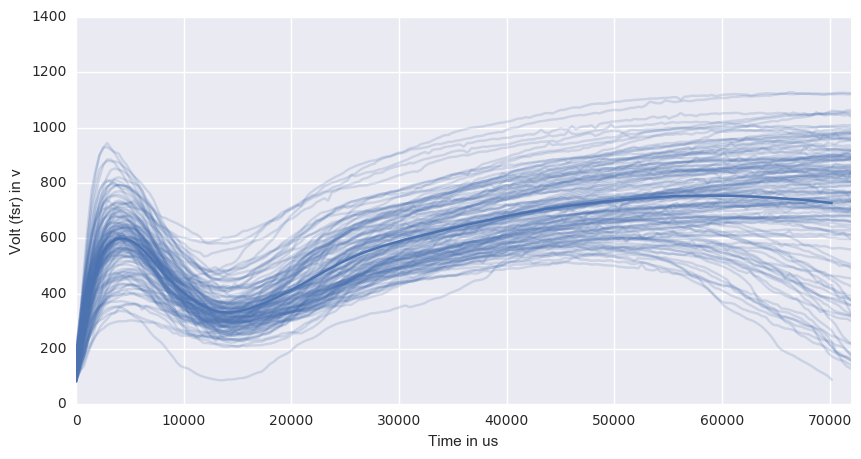

In [1170]:
fig, axes = plt.subplots(ncols=1, figsize=(10,5))
ax = sns.tsplot(data=response_only_df, 
                time='time', 
                unit='epoch', 
                value='response', 
                err_style='unit_traces',
                ax=axes)
ax.set_xlim(0, 72000)
ax.set_xlabel('Time in us')
ax.set_ylabel('Volt (fsr) in v')
plt.show()

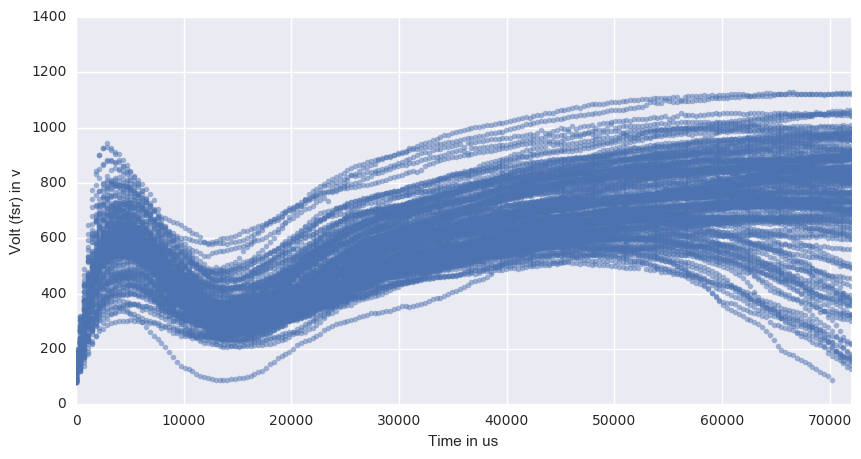

In [1171]:
fig, axes = plt.subplots(ncols=1, figsize=(10,5))
ax = sns.tsplot(data=response_only_df, 
                time='time', 
                unit='epoch', 
                value='response', 
                err_style='unit_points',
                ax=axes)
ax.set_xlim(0, 72000)
ax.set_xlabel('Time in us')
ax.set_ylabel('Volt (fsr) in v')
plt.show()

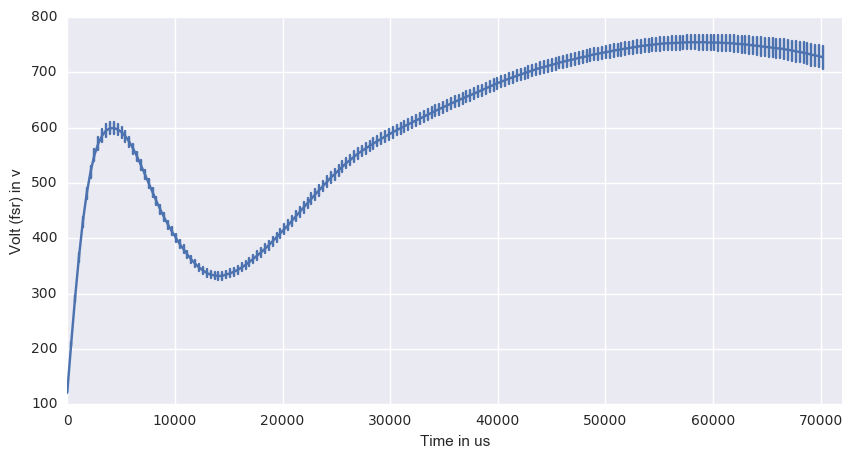

In [1172]:
fig, axes = plt.subplots(ncols=1, figsize=(10,5))
ax = sns.tsplot(data=response_only_df, 
                time='time', 
                unit='epoch', 
                value='response', 
                err_style='ci_bars',
                ax=axes)
ax.set_xlim(0, 72000)
ax.set_xlabel('Time in us')
ax.set_ylabel('Volt (fsr) in v')
plt.show()

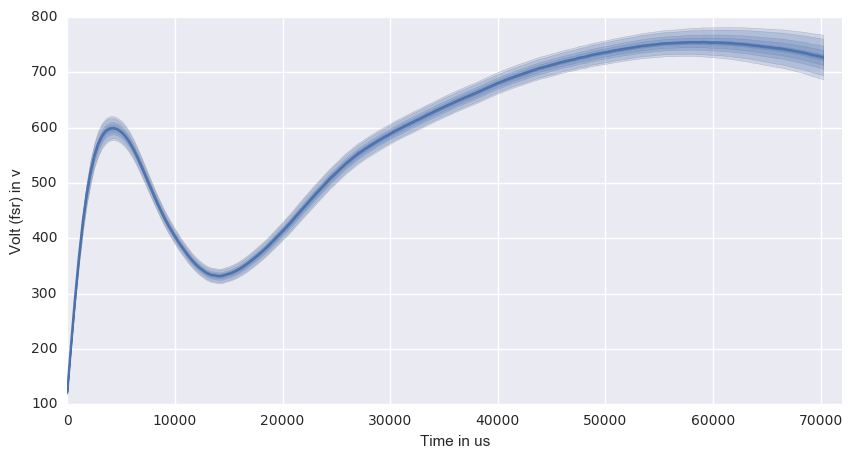

In [1190]:
fig, axes = plt.subplots(ncols=1, figsize=(10,5))
ax = sns.tsplot(data=response_only_df, 
                time='time', 
                unit='epoch', 
                value='response', 
#                 err_style='ci_band',
#                 color='g',
#                 interpolate=False,
#                 n_boot=5000,
                ci=[1,10,20,50,70,90,95],
                ax=axes)
ax.set_xlim(0, 72000)
ax.set_xlabel('Time in us')
ax.set_ylabel('Volt (fsr) in v')
plt.show()

In [1283]:
def temporal_recalibration(csvLoc):
    data = pd.read_csv(csvLoc, sep=',')
    
    #interpolation
    f = interpolate.interp1d(data['time[us]'], data['volt(fsr)[v]'])
    gap = 360
    y = f(np.arange(data['time[us]'].min(), data['time[us]'].max(), gap))

    f_signal = interpolate.interp1d(data['time[us]'], data['signal'], kind='nearest')
    y_signal = f_signal(np.arange(data['time[us]'].min(), data['time[us]'].max(), gap))
    
    data_reponse_interp_360 = pd.DataFrame({'time[us]':np.arange(data['time[us]'].min(), 
                                                                 data['time[us]'].max(), gap),
                                            'volt(fsr)[v]':y,
                                            'signal':y_signal})
    
    #threshold    
    threshold = 80
    data_reponse_interp_360.loc[data_reponse_interp_360['volt(fsr)[v]'] < 80, 'volt(fsr)[v]'] = 0
    
    #split the dataframe
    # difference between consecutive element
    pre_post_signal_diff = np.ediff1d(data_reponse_interp_360['signal'])

    # where the difference is +1 : Signal turning on (0 --> 1)
    # 1 has been added to return the index of first 'on'
    signal_first_ones_index = np.where(pre_post_signal_diff==1)[0] + 1
    signal_first_ones_time = data_reponse_interp_360.loc[signal_first_ones_index, 'time[us]'].values

    signal_last_ones_index = np.where(pre_post_signal_diff==-1)[0]
    signal_last_ones_time = data_reponse_interp_360.loc[signal_last_ones_index, 'time[us]'].values

    # 300 ms
    # need to make this multiples of 360
    cut_window_div = 300000 / 360
    cut_time = signal_first_ones_index - round(cut_window_div)

    data_split = np.split(data_reponse_interp_360, 
                          cut_time)[1:]
    
    missing_epochs = []
    error_epochs = []
    for num, df_tmp in enumerate(data_split, 1):
        if len(df_tmp[df_tmp['volt(fsr)[v]'] > 80]) == 0:
            missing_epochs.append(num)
            continue

        # if there are more than two responses
        elif np.any(np.diff(df_tmp[df_tmp['volt(fsr)[v]'] > 80].index)!=1):
            cut_index_thr = np.diff(df_tmp[df_tmp['volt(fsr)[v]'] > 80].index).argmax()
            cut_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[cut_index_thr]

            # select longer part of the response
            first_df_tmp = df_tmp.ix[:cut_index]
            second_df_tmp = df_tmp.ix[cut_index:]
            get_longer_df = lambda x,y : x if len(x[x['volt(fsr)[v]']>80]) > len(y[y['volt(fsr)[v]']>80]) else y
            new = get_longer_df(first_df_tmp, second_df_tmp)
            new = new.reindex_like(df_tmp)
            new['time[us]'] = df_tmp['time[us]']
            new['signal'] = df_tmp['signal']
            df_tmp = new
            df_tmp.ix[df_tmp.index[df_tmp.isnull()['volt(fsr)[v]']], 'volt(fsr)[v]'] = 0


        # first contact 
        first_touch_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[0]
        # last contact
        last_touch_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[-1]

        # Estimating second peak
        # Smooth data : strong smoothing
        b, a = signal.butter(4, 0.01)
        df_tmp['svolt(fsr)[v]'] = signal.filtfilt(b, a, df_tmp['volt(fsr)[v]'])

        max_response_index_from_strong_smoothing = df_tmp['svolt(fsr)[v]'].idxmax()
        second_window_time = 50
        lower_window_bound_2nd_peak = max_response_index_from_strong_smoothing - second_window_time
        higher_window_bound_2nd_peak = max_response_index_from_strong_smoothing + second_window_time
        second_peak_value = df_tmp['volt(fsr)[v]'].ix[lower_window_bound_2nd_peak:higher_window_bound_2nd_peak].max()
        second_peak_index = df_tmp['volt(fsr)[v]'].ix[lower_window_bound_2nd_peak:higher_window_bound_2nd_peak].idxmax()
        second_peak_time = df_tmp.ix[second_peak_index, 'time[us]']

        # First peak
        # must appear before the second peak
        first_peak_index = (df_tmp['volt(fsr)[v]'] - df_tmp['svolt(fsr)[v]']).ix[:second_peak_index].idxmax()
        first_peak_value = df_tmp.ix[first_peak_index, 'volt(fsr)[v]']
        first_peak_time = df_tmp.ix[first_peak_index, 'time[us]']

        # If first peak is far from the first touch
        if (first_peak_index - first_touch_index) > 25:
            error_epochs.append(num)


#         # Plot gradient
#         plt.plot(df_tmp['time[us]'], 
#                  df_tmp['volt(fsr)[v]'], label='Response data')
#         plt.plot(df_tmp['time[us]'], 
#                  df_tmp['svolt(fsr)[v]'], alpha=0.2, label='Smoothed response data')
#         plt.plot(df_tmp['time[us]'], 
#                  df_tmp['volt(fsr)[v]'] - df_tmp['svolt(fsr)[v]'], 
#                  alpha=0.2, label='Signal diff')
#         plt.plot(second_peak_time, second_peak_value, 'ro', label='Second peak')
#         plt.plot(first_peak_time, first_peak_value, 'bo', label='First peak')
#         plt.axvspan(df_tmp[df_tmp['signal']!=0]['time[us]'].values[0], 
#                     df_tmp[df_tmp['signal']!=0]['time[us]'].values[-1], 
#                     color='r', alpha=0.3, label = 'Sound signal')
#         plt.axvline(df_tmp.ix[first_touch_index, 'time[us]'], label = 'First touch')
#         plt.axvline(df_tmp.ix[last_touch_index, 'time[us]'], color='green', label = 'last touch')
#         plt.title(num)
#         plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))


#         plt.show()

    print('Error epochs : ', ' '.join([str(x) for x in error_epochs]))
    print('Missing epochs : ', ' '.join([str(x) for x in missing_epochs]))
    
    response_only_df = pd.DataFrame()
    timing_df = pd.DataFrame()
    timing_diff_df = pd.DataFrame()
    for num, df_tmp in enumerate(data_split, 1):
        if len(df_tmp[df_tmp['volt(fsr)[v]'] > 80]) == 0:
            missing_epochs.append(num)
            continue

        # if there are more than two responses
        elif np.any(np.diff(df_tmp[df_tmp['volt(fsr)[v]'] > 80].index)!=1):
            cut_index_thr = np.diff(df_tmp[df_tmp['volt(fsr)[v]'] > 80].index).argmax()
            cut_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[cut_index_thr]

            # select longer part of the response
            first_df_tmp = df_tmp.ix[:cut_index]
            second_df_tmp = df_tmp.ix[cut_index:]
            get_longer_df = lambda x,y : x if len(x[x['volt(fsr)[v]']>80]) > len(y[y['volt(fsr)[v]']>80]) else y
            new = get_longer_df(first_df_tmp, second_df_tmp)
            new = new.reindex_like(df_tmp)
            new['time[us]'] = df_tmp['time[us]']
            new['signal'] = df_tmp['signal']
            df_tmp = new
            df_tmp.ix[df_tmp.index[df_tmp.isnull()['volt(fsr)[v]']], 'volt(fsr)[v]'] = 0

        # first contact 
        first_touch_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[0]
        first_touch_time = df_tmp.ix[first_touch_index, 'time[us]']
        # last contact
        last_touch_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[-1]
        last_touch_time = df_tmp.ix[last_touch_index, 'time[us]']

        # sound first
        first_sound_index = df_tmp[df_tmp['signal']!=0].index.values[0]
        first_sound_time = df_tmp.ix[first_sound_index, 'time[us]']

        # Estimating second peak
        # Smooth data : strong smoothing
        b, a = signal.butter(4, 0.01)
        df_tmp['svolt(fsr)[v]'] = signal.filtfilt(b, a, df_tmp['volt(fsr)[v]'])

        max_response_index_from_strong_smoothing = df_tmp['svolt(fsr)[v]'].idxmax()
        second_window_time = 50
        lower_window_bound_2nd_peak = max_response_index_from_strong_smoothing - second_window_time
        higher_window_bound_2nd_peak = max_response_index_from_strong_smoothing + second_window_time
        second_peak_value = df_tmp['volt(fsr)[v]'].ix[lower_window_bound_2nd_peak:higher_window_bound_2nd_peak].max()
        second_peak_index = df_tmp['volt(fsr)[v]'].ix[lower_window_bound_2nd_peak:higher_window_bound_2nd_peak].idxmax()
        second_peak_time = df_tmp.ix[second_peak_index, 'time[us]']

        # First peak
        # must appear before the second peak
        first_peak_index = (df_tmp['volt(fsr)[v]'] - df_tmp['svolt(fsr)[v]']).ix[:second_peak_index].idxmax()
        first_peak_value = df_tmp.ix[first_peak_index, 'volt(fsr)[v]']
        first_peak_time = df_tmp.ix[first_peak_index, 'time[us]']


        timing_df_tmp = pd.DataFrame({'epoch':[num],
                                  'first_touch_time':first_touch_time,
                                  'first_peak_time':first_peak_time,
                                  'second_peak_time':second_peak_time,
                                  'last_touch_time':last_touch_time})

        timing_diff_df_tmp = pd.DataFrame({'epoch':[num],
                                           'diff_in_peak':second_peak_time-first_peak_time,
                                           'touch_duration':last_touch_time-first_touch_time,
                                           'diff_in_peak_1_to_sound_onset':first_sound_time-first_peak_time,
                                           'diff_in_peak_2_to_sound_onset':first_sound_time-second_peak_time,
                                           'diff_in_first_touch_to_sound_onset':first_sound_time-first_touch_time,
                                           'diff_in_last_touch_to_sound_onset':first_sound_time-last_touch_time,
                                          })
        timing_df = pd.concat([timing_df, timing_df_tmp.set_index('epoch')])
        timing_diff_df = pd.concat([timing_diff_df, timing_diff_df_tmp.set_index('epoch')])
        
        if num not in error_epochs and num not in missing_epochs:
            df_tmp = df_tmp[df_tmp['volt(fsr)[v]'] != 0].reset_index()
            response_only_df = pd.concat([response_only_df, df_tmp['volt(fsr)[v]']], axis=1)
#             plt.plot(df_tmp.reset_index().index, df_tmp['volt(fsr)[v]'])

    response_only_df.columns = np.arange(1, len(response_only_df.columns)+1)
    response_only_df = response_only_df.stack().reset_index()
    response_only_df.columns = ['time', 'epoch', 'response']
    response_only_df['time'] = response_only_df['time']*360

    fig, axes = plt.subplots(ncols=1, figsize=(10,5))
    sns.tsplot(data=response_only_df, 
               time='time', 
               unit='epoch', 
               value='response')
    axes.set_xlim(0, 72000)
    axes.set_xlabel('Time in us')
    axes.set_ylabel('Volt (fsr) in v')
    plt.show()

Error epochs :  2 46
Missing epochs :  1


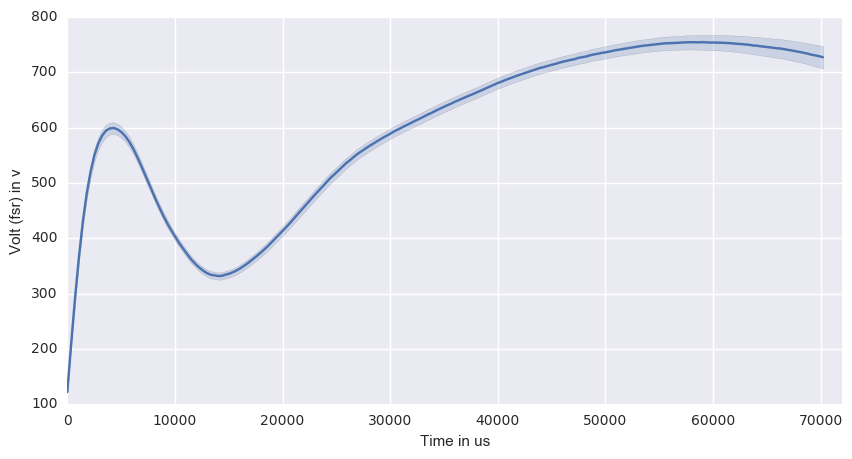

In [1284]:
temporal_recalibration('park_3_2_exp_1_dataLog.txt')

Error epochs :  52 76
Missing epochs :  1


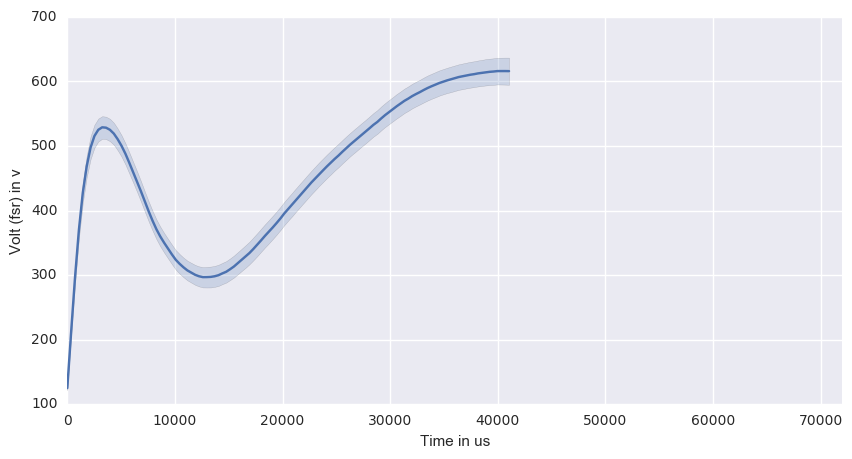

In [1285]:
temporal_recalibration('park_5_exp_0_dataLog.txt')

Error epochs :  87 108 111 121
Missing epochs :  


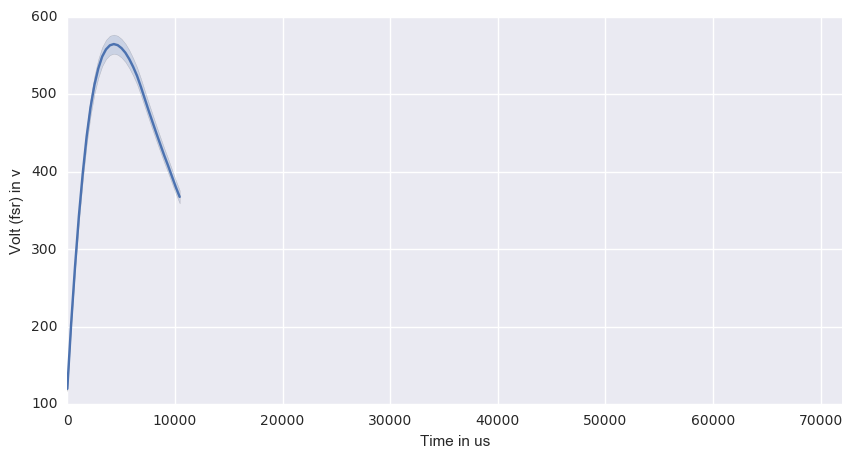

In [1286]:
temporal_recalibration('park_5_exp_1_dataLog.txt')

Error epochs :  73 83 84 90 92 96 98 102 108 110 111 114 115 116 117 120 123 126
Missing epochs :  1 93 97 99


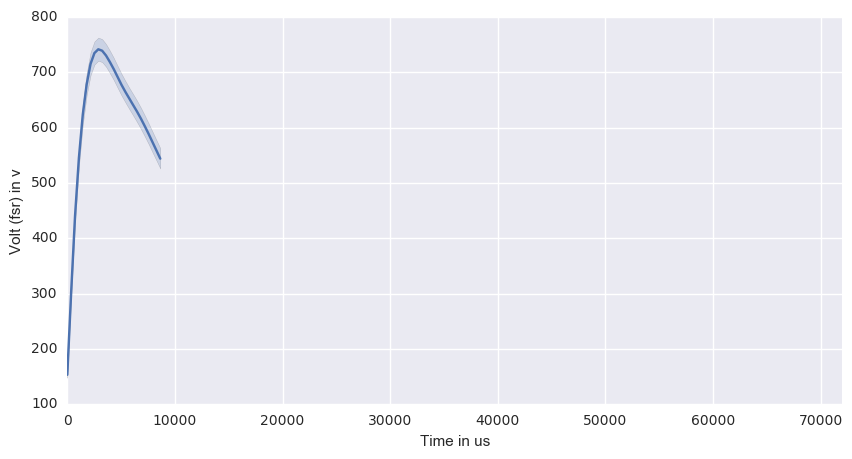

In [1288]:
temporal_recalibration('park_5_exp_2_dataLog.txt')

Error epochs :  44 53 54 63 71 114 119 120 128 130
Missing epochs :  46


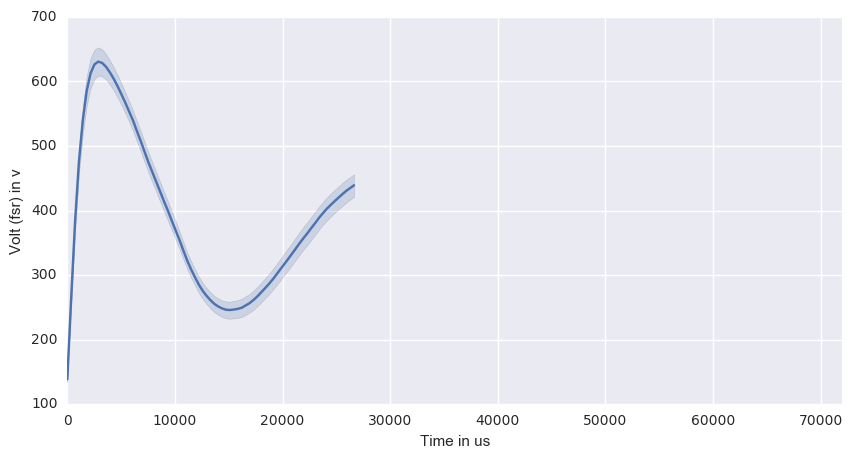

In [1289]:
temporal_recalibration('park_5_exp_3_dataLog.txt')

Error epochs :  102 129 130
Missing epochs :  


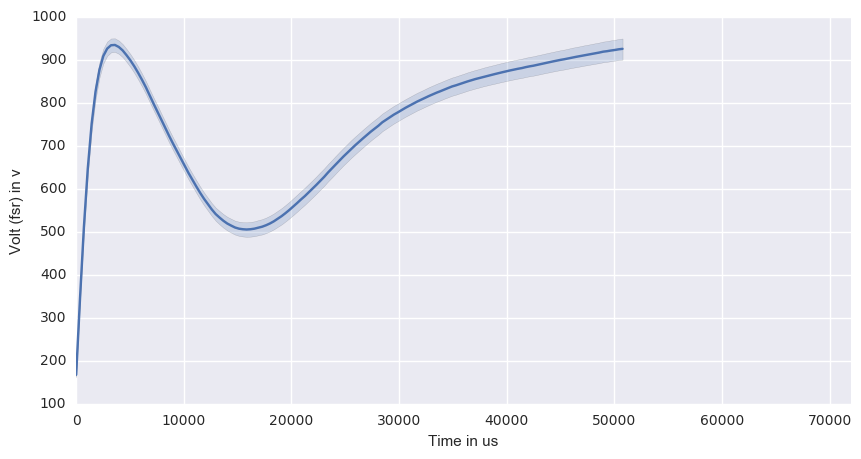

In [1290]:
temporal_recalibration('park_5_exp_4_dataLog.txt')

Error epochs :  27 104 109 110
Missing epochs :  1 2 3 4


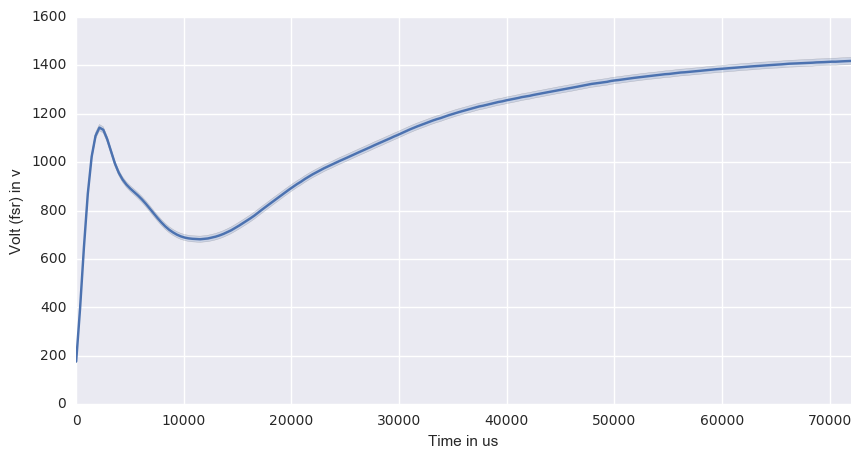

In [1292]:
temporal_recalibration('parkHard0_exp_0_dataLog.txt')

Error epochs :  
Missing epochs :  1


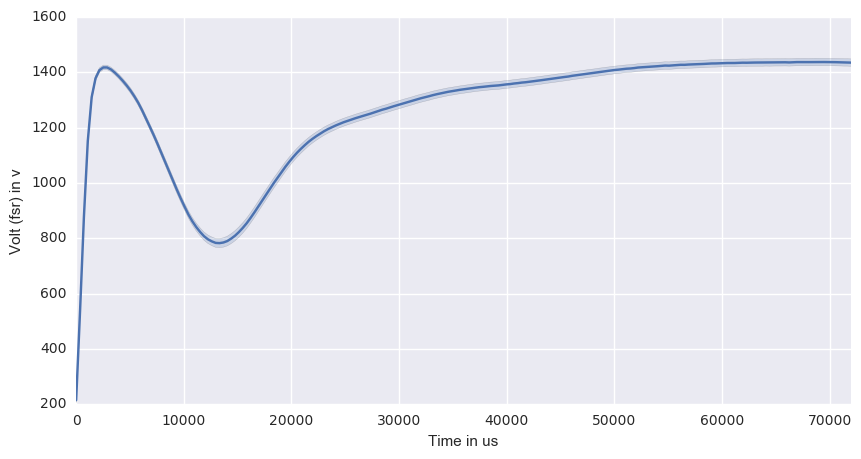

In [1294]:
temporal_recalibration('parkHard_exp_0_dataLog.txt')